In [1]:
import warnings
warnings.filterwarnings('ignore')

import os
import shutil
import matplotlib.pyplot as plt
import numpy as pd
from tqdm.auto import tqdm
import yaml
import ultralytics
from ultralytics import YOLO
import torch

In [5]:
train_source_images_dir = 'face-detection-dataset/images/train'
train_source_labels_dir = 'face-detection-dataset/labels/train/'
train_destination_dir = 'dataset/train/'

val_source_images_dir = 'face-detection-dataset/images/val/'
val_source_labels_dir = 'face-detection-dataset/labels/val/'
val_destination_dir = 'dataset/val/'

In [13]:
# Copy train images
for filename in tqdm(os.listdir(train_source_images_dir)):
    train_src_path = os.path.join(train_source_images_dir, filename)
    train_dst_path = os.path.join(train_destination_dir, filename)
    shutil.copy(train_src_path, train_dst_path)

  0%|          | 0/13386 [00:00<?, ?it/s]

In [23]:
# Copy val images
for filename in tqdm(os.listdir(val_source_images_dir)):
    val_src_path = os.path.join(val_source_images_dir, filename)
    val_dst_path = os.path.join(val_destination_dir, filename)
    shutil.copy(val_src_path, val_dst_path)

  0%|          | 0/3347 [00:00<?, ?it/s]

In [25]:
# Copy train labels
for filename in tqdm(os.listdir(train_source_labels_dir)):
    train_src_path = os.path.join(train_source_labels_dir, filename)
    train_dst_path = os.path.join(train_destination_dir, filename)
    shutil.copy(train_src_path, train_dst_path)

  0%|          | 0/13386 [00:00<?, ?it/s]

In [15]:
# Copy val labels
for filename in tqdm(os.listdir(val_source_labels_dir)):
    val_src_path = os.path.join(val_source_labels_dir, filename)
    val_dst_path = os.path.join(val_destination_dir, filename)
    shutil.copy(val_src_path, val_dst_path)

  0%|          | 0/3347 [00:00<?, ?it/s]

In [7]:
l=os.listdir(val_destination_dir)
l = sorted(l)
# print(l)
counter= 0
for i in tqdm(range(0,len(l),2)):
    if(l[i][0:-4]==l[i+1][0:-4]):
        counter +=1
    else :
        print('false')
print(counter)

  0%|          | 0/3347 [00:00<?, ?it/s]

3347


In [9]:
l=os.listdir(train_destination_dir)
l = sorted(l)
# print(l)
counter= 0
for i in tqdm(range(0,len(l),2)):
    if(l[i][0:-4]==l[i+1][0:-4]):
        counter +=1
    else :
        print('false')
print(counter)

  0%|          | 0/13386 [00:00<?, ?it/s]

13386


In [11]:
dataset_config = {
    'nc': 1, 
    'names': ['face'], 
    'train': 'dataset/train/',  
    'val': 'dataset/val/',
    'device': 0
}

In [13]:
with open('dataset.yaml', 'w') as file:
    yaml.dump(dataset_config, file, default_flow_style=False)

In [15]:
print(ultralytics.checks())

Ultralytics 8.3.139  Python-3.12.7 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Setup complete  (12 CPUs, 15.4 GB RAM, 190.8/250.0 GB disk)
None


In [17]:
model = YOLO('yolov8n.pt')

In [21]:
torch.cuda.is_available()

True

In [23]:
if torch.cuda.is_available():
    model.half()

In [25]:
max_batch_size = 16

In [27]:
model.to(device=0)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_s

In [27]:
results = model.train(data='dataset.yaml', batch=max_batch_size, epochs=100, imgsz=640)

engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False, project=None, rect=False, resume=False, retina_masks=False, save=True, save

train: Scanning D:\Mugni\Kuliah\Semester 7\Proposal\Project TA\YOLO\dataset\train.cache... 13386 images, 0 backgrounds,


albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'
val: Fast image access  (ping: 0.20.1 ms, read: 217.5121.8 MB/s, size: 308.9 KB)


val: Scanning D:\Mugni\Kuliah\Semester 7\Proposal\Project TA\YOLO\dataset\val.cache... 3347 images, 0 backgrounds, 0 co


Plotting labels to runs\detect\train6\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train6
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.27G      1.385       1.53       1.24         57        640: 100%|██████████| 837/837 [03:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.868      0.726      0.811      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.52G      1.296     0.9667      1.122         53        640: 100%|██████████| 837/837 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.875      0.706      0.799      0.502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.34G       1.32     0.9226      1.141         30        640: 100%|██████████| 837/837 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.858      0.674      0.759      0.463

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100       2.9G      1.337     0.9132      1.152         41        640: 100%|██████████| 837/837 [03:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299       0.88      0.701      0.797      0.503

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.85G      1.306     0.8608      1.142         62        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.878      0.734      0.814      0.516

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.86G      1.282     0.8183      1.131         35        640: 100%|██████████| 837/837 [03:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.873      0.736       0.82      0.522

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.84G      1.264     0.7908      1.116         74        640: 100%|██████████| 837/837 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.882       0.76      0.833      0.532

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100       3.2G      1.247     0.7741      1.114         38        640: 100%|██████████| 837/837 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.892      0.761      0.842      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.09G       1.24     0.7638      1.108         38        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.883      0.767      0.842      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.89G      1.231     0.7401      1.107         51        640: 100%|██████████| 837/837 [03:15<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.893      0.765      0.846      0.548

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.94G      1.224      0.731      1.102         32        640: 100%|██████████| 837/837 [03:28<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.885      0.772      0.845      0.548

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.11G       1.22     0.7199      1.097         40        640: 100%|██████████| 837/837 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896      0.772      0.851      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.77G      1.211     0.7136      1.094         46        640: 100%|██████████| 837/837 [03:22<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.881      0.782      0.851      0.556

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.17G      1.207     0.7068       1.09         58        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.776      0.858      0.561

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.78G      1.203     0.6983      1.088        155        640: 100%|██████████| 837/837 [03:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.893      0.785      0.861      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.14G        1.2     0.6948      1.084         37        640: 100%|██████████| 837/837 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.783       0.86      0.567

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.05G      1.202     0.6931      1.088         42        640: 100%|██████████| 837/837 [03:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299        0.9      0.781       0.86      0.565

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.76G      1.192     0.6841      1.085         47        640: 100%|██████████| 837/837 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.901      0.782      0.864      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.99G      1.189     0.6774       1.08         54        640: 100%|██████████| 837/837 [03:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896      0.785       0.86      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.93G      1.182     0.6714       1.08         40        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.886      0.798      0.866      0.571

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.64G      1.189     0.6736      1.076         47        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.792      0.868      0.572

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.15G       1.18     0.6633      1.076         56        640: 100%|██████████| 837/837 [06:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.889        0.8       0.87      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.85G      1.178     0.6656      1.078         47        640: 100%|██████████| 837/837 [03:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299       0.89        0.8      0.872      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.26G      1.179     0.6606      1.073         70        640: 100%|██████████| 837/837 [03:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.888      0.807      0.871      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.99G      1.173     0.6509      1.071         72        640: 100%|██████████| 837/837 [03:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.901      0.793      0.871      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.28G      1.167     0.6508      1.069         18        640: 100%|██████████| 837/837 [03:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.893      0.803      0.874       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.98G      1.167     0.6489      1.068         45        640: 100%|██████████| 837/837 [03:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.896      0.794      0.872      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       3.6G      1.161     0.6415      1.066         55        640: 100%|██████████| 837/837 [05:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.889      0.806      0.875      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.07G      1.158     0.6348      1.063         59        640: 100%|██████████| 837/837 [04:20<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.894      0.805      0.874      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.62G      1.165     0.6403      1.067         49        640: 100%|██████████| 837/837 [04:32<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.891      0.814       0.88      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.22G      1.155     0.6334      1.065         51        640: 100%|██████████| 837/837 [03:18<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.883       0.81      0.877      0.583

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.39G      1.156     0.6317      1.064         54        640: 100%|██████████| 837/837 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.892      0.811      0.878      0.585

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.57G      1.162     0.6283      1.064         62        640: 100%|██████████| 837/837 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.807      0.878      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.85G      1.155     0.6288      1.062         61        640: 100%|██████████| 837/837 [03:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.898      0.805       0.88      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       3.1G      1.149      0.622      1.058         45        640: 100%|██████████| 837/837 [03:18<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.897      0.807      0.879      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.82G      1.145     0.6173      1.057         39        640: 100%|██████████| 837/837 [03:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299       0.89      0.811      0.879      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       3.2G      1.151     0.6223      1.063         57        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.893      0.814      0.882      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.17G      1.146     0.6157      1.057         39        640: 100%|██████████| 837/837 [03:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.888      0.819      0.881      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.92G      1.147     0.6139      1.055         47        640: 100%|██████████| 837/837 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.899      0.814      0.885      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.63G      1.133     0.6052      1.052         42        640: 100%|██████████| 837/837 [03:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896      0.817      0.885      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.76G      1.137     0.6117      1.055         31        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.902      0.813      0.886      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         3G      1.139     0.6076      1.057         49        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.902      0.808      0.885      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.83G      1.134     0.6029      1.052         63        640: 100%|██████████| 837/837 [03:07<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.897      0.816      0.885      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.43G       1.13     0.5988      1.052         56        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.894      0.816      0.886      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.66G      1.136     0.6028      1.052         58        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896      0.816      0.886      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.43G       1.13     0.5971      1.051         76        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.894      0.818      0.886      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       3.1G      1.124      0.596      1.052         61        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.892      0.816      0.886      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.86G      1.123     0.5898      1.047         28        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.899      0.814      0.887      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.06G      1.124      0.586      1.045         52        640: 100%|██████████| 837/837 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.819      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.29G      1.124     0.5863      1.044         71        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.898      0.815      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.95G      1.126     0.5909      1.046         49        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299        0.9      0.814      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.94G      1.119     0.5833      1.047         64        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299       0.89       0.82      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.89G      1.122     0.5864      1.048         30        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.891      0.821      0.888      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.55G      1.114     0.5831      1.046         25        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299       0.89      0.819      0.887      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.87G      1.121     0.5825      1.047         29        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.816      0.889      0.595

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.31G      1.113     0.5757       1.04         33        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.892      0.822      0.889      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.15G      1.116     0.5802      1.042         36        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895       0.82       0.89      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.76G      1.111      0.573      1.041         44        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.888      0.823      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.13G      1.109     0.5724      1.042         29        640: 100%|██████████| 837/837 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.893      0.821      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.12G      1.112     0.5712      1.041         56        640: 100%|██████████| 837/837 [03:06<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.893      0.821      0.889      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.96G       1.11     0.5683      1.035         39        640: 100%|██████████| 837/837 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.892       0.82      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.33G      1.099       0.56      1.037         39        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.893      0.821      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.38G      1.108     0.5631      1.038         60        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.894      0.821       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.05G      1.102     0.5588      1.034         68        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895       0.82      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.83G      1.107     0.5643      1.035         46        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896      0.819      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.83G      1.099     0.5579      1.035         40        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.893      0.821      0.889      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.18G      1.099     0.5567      1.033         60        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.897       0.82       0.89      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.96G      1.098     0.5535      1.033         97        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896       0.82       0.89      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.78G      1.106     0.5613      1.031         23        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.897      0.819       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.56G       1.09     0.5503      1.031         76        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.898      0.819       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.68G      1.092     0.5473       1.03         54        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.893      0.822       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.37G       1.09      0.548      1.029         44        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895       0.82       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.89G      1.086     0.5421      1.028         52        640: 100%|██████████| 837/837 [03:05<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.898      0.819       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.34G      1.085     0.5415      1.027         79        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.898      0.818       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.36G      1.086     0.5361      1.027         41        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.898      0.819       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.86G      1.083     0.5351      1.023         51        640: 100%|██████████| 837/837 [03:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.899      0.817      0.889      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.94G       1.08     0.5339      1.024         36        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299        0.9      0.817      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.68G      1.081     0.5321      1.027         30        640: 100%|██████████| 837/837 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.901      0.816      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.08G      1.074     0.5304      1.027         71        640: 100%|██████████| 837/837 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299        0.9      0.817      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.31G      1.077     0.5289      1.021         61        640: 100%|██████████| 837/837 [03:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.901      0.816       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.68G      1.074     0.5247      1.021         46        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.901      0.816       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.96G       1.07     0.5226      1.018         44        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.899      0.815      0.889      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.06G      1.075     0.5248      1.023         76        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.902      0.814      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.97G      1.073     0.5215      1.019         61        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299        0.9      0.814      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.79G      1.067     0.5183      1.017         42        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299        0.9      0.815      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.85G      1.061     0.5152      1.015         68        640: 100%|██████████| 837/837 [03:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.899      0.815       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.04G      1.066     0.5161       1.02         84        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.899      0.816       0.89      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100       2.7G      1.059     0.5138      1.014         45        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.897      0.817       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.57G      1.053     0.5076      1.014         68        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.898      0.816       0.89      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.03G       1.06     0.5061      1.014         52        640: 100%|██████████| 837/837 [03:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.898      0.816       0.89      0.597


Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.16G      1.047     0.4671      1.004         21        640: 100%|██████████| 837/837 [03:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.897      0.816       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.66G      1.044      0.462      1.004         20        640: 100%|██████████| 837/837 [03:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896      0.818       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.87G       1.04     0.4566      1.002         25        640: 100%|██████████| 837/837 [03:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.896      0.818       0.89      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.98G      1.037     0.4537     0.9981         29        640: 100%|██████████| 837/837 [03:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.896      0.818       0.89      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       3.4G      1.036     0.4495     0.9989         21        640: 100%|██████████| 837/837 [03:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.896      0.816      0.889      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.97G      1.031     0.4476     0.9984         36        640: 100%|██████████| 837/837 [03:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.896      0.815      0.889      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.88G       1.03     0.4461     0.9958         15        640: 100%|██████████| 837/837 [03:01<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.895      0.816      0.889      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.24G      1.027     0.4442     0.9954         29        640: 100%|██████████| 837/837 [03:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.816      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       3.4G      1.027     0.4417     0.9976         46        640: 100%|██████████| 837/837 [03:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.895      0.816      0.889      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.97G      1.022     0.4398     0.9931         41        640: 100%|██████████| 837/837 [03:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:

                   all       3347      10299      0.896      0.814      0.889      0.597



100 epochs completed in 6.261 hours.
Optimizer stripped from runs\detect\train6\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train6\weights\best.pt, 6.2MB

Validating runs\detect\train6\weights\best.pt...
Ultralytics 8.3.139  Python-3.12.7 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 105/105 [00:


                   all       3347      10299      0.901      0.816       0.89      0.597
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs\detect\train6


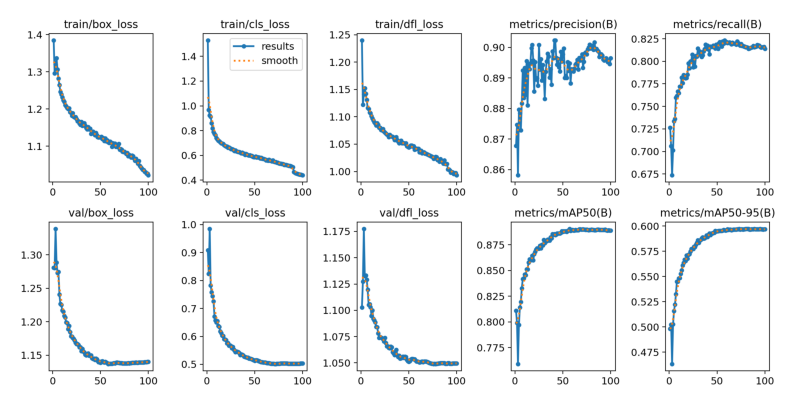

In [29]:
result_img = plt.imread('runs/detect/train6/results.png')
plt.figure(figsize=(10, 10))
plt.imshow(result_img)
plt.axis('off')
plt.show()

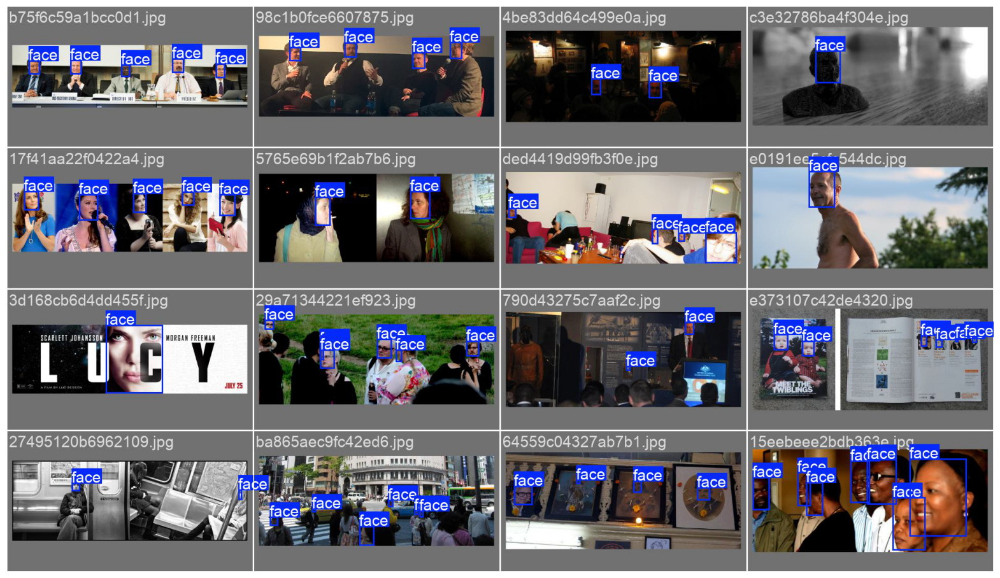

In [31]:
result_img = plt.imread('runs/detect/train6/val_batch0_labels.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

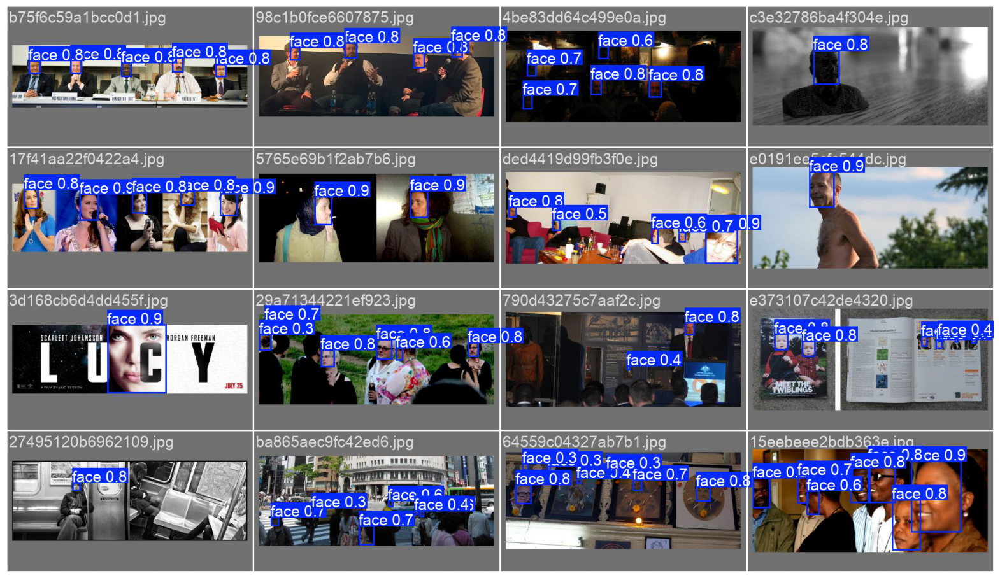

In [37]:
result_img = plt.imread('runs/detect/train6/val_batch0_pred.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

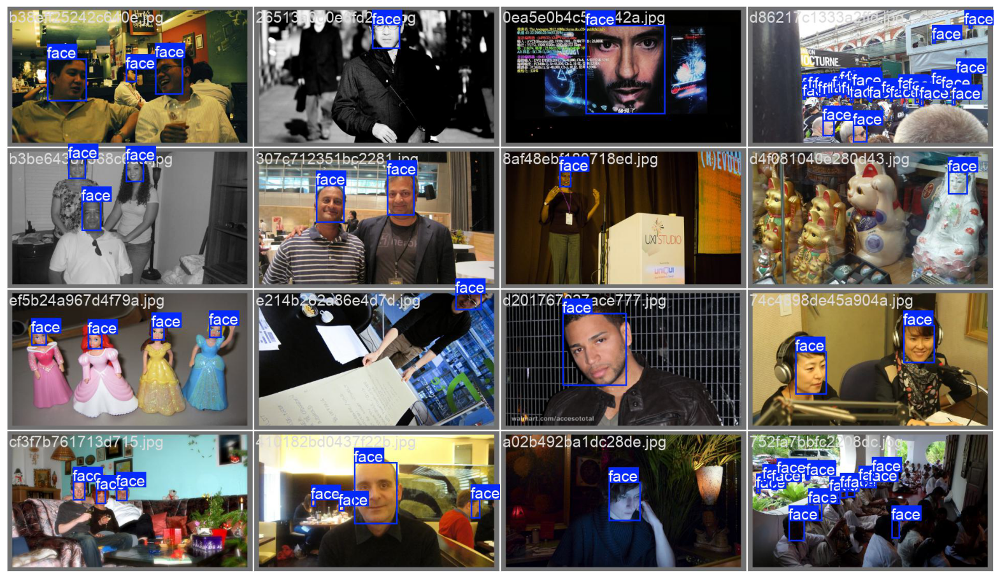

In [33]:
result_img = plt.imread('runs/detect/train6/val_batch1_labels.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

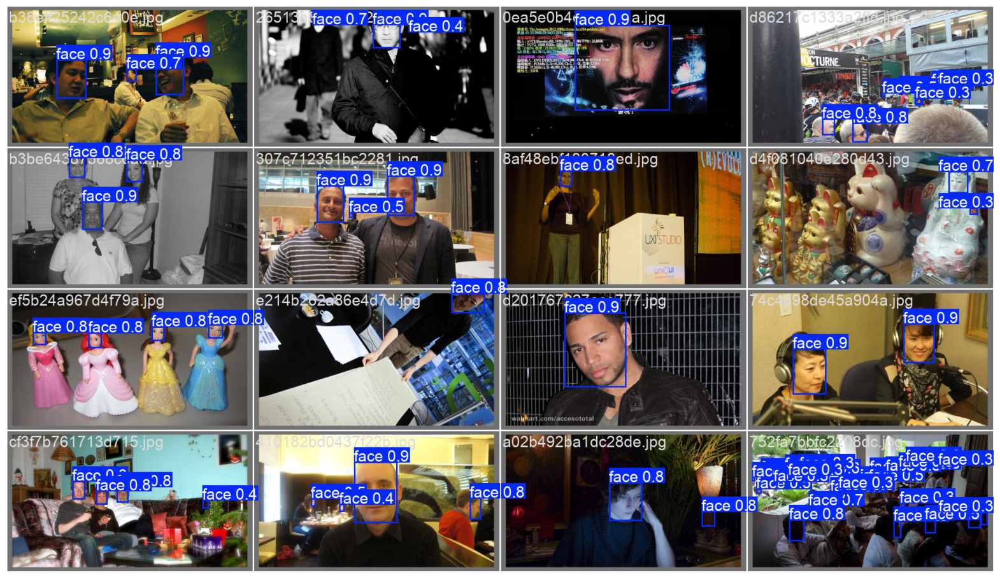

In [39]:
result_img = plt.imread('runs/detect/train6/val_batch1_pred.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

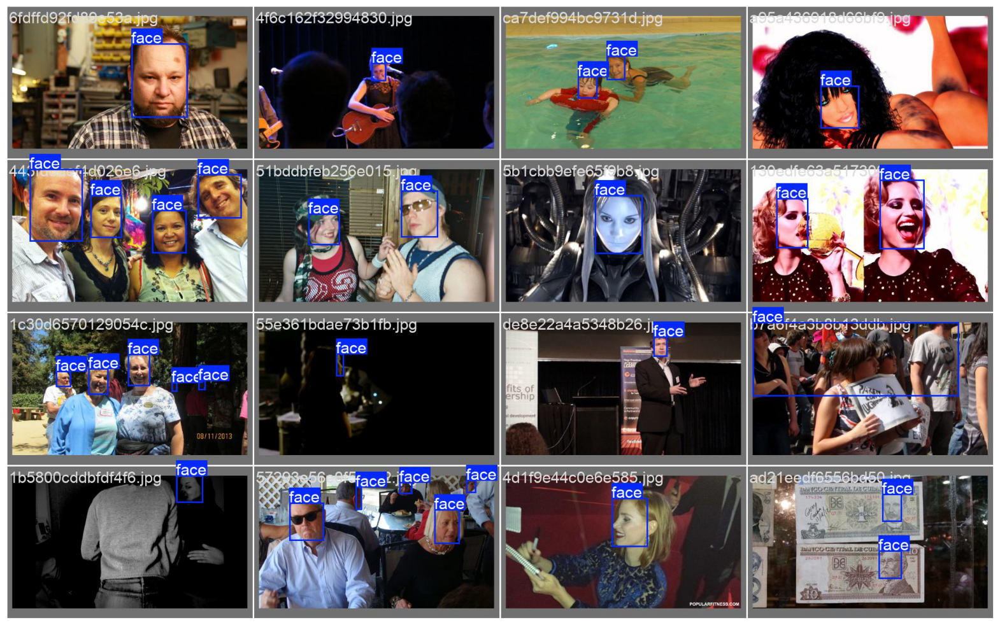

In [35]:
result_img = plt.imread('runs/detect/train6/val_batch2_labels.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()

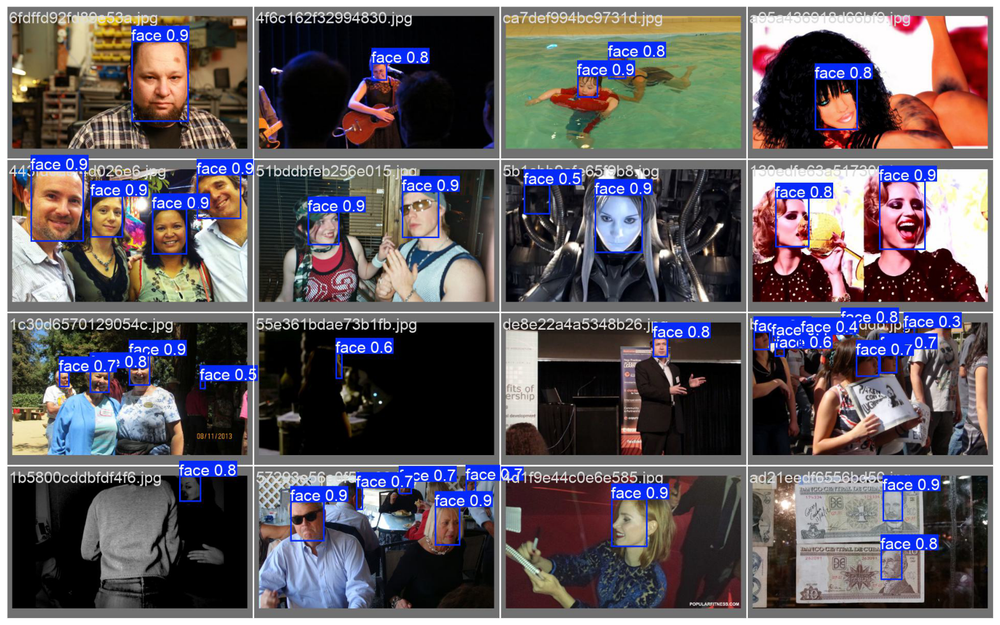

In [41]:
result_img = plt.imread('runs/detect/train6/val_batch2_pred.jpg')
plt.figure(figsize=(20, 20))
plt.imshow(result_img)
plt.axis('off')
plt.show()